#### Hello!! Gonna try using GTFS for the first time!

##### Going for some stop locations in portland oregon. hopefully will be cool lookin.

Find the data description/download link here --> https://transitfeeds.com/p/trimet/43/20231016

In [1]:
##### First step. Try to make a US county map
import matplotlib as plt
import matplotlib.pyplot as pyplot
import numpy as np
import pandas as pd
import geopandas

import gtfs_kit as gt

import pydeck as pdk

#trimet_stops = pd.read_csv('C:/Users/aaron/Code/Data/GTFS/trimet_stops_2023_10_16 - trimet_stops_2023_10_16.csv')

In [2]:
feed = gt.read_feed('C:/Users/aaron/Code/Data/GTFS/trimet_2023_10_16.zip', dist_units = 'mi')

In [3]:
feed.describe()

,indicator,value
0,agencies,"[TriMet, Portland Streetcar, Portland Aerial T..."
1,timezone,America/Los_Angeles
2,start_date,20231008
3,end_date,20240224
4,num_routes,88
5,num_trips,64119
6,num_stops,6379
7,num_shapes,1330
8,sample_date,20231012
9,num_routes_active_on_sample_date,87


In [4]:
type(feed.trips)

pandas.core.frame.DataFrame

In [5]:
feed.stop_times.loc[40000]

trip_id                                 12937119
arrival_time                            11:48:03
departure_time                          11:48:03
stop_id                                     9426
stop_sequence                                 38
stop_headsign          Cleveland Ave Park & Ride
pickup_type                                    0
drop_off_type                                  0
shape_dist_traveled                      70109.5
timepoint                                      0
continuous_drop_off                          NaN
continuous_pickup                            NaN
Name: 40000, dtype: object

In [6]:
#### first im gonna group the stop times by stop.

stop_times = feed.stop_times

In [7]:
stop_freq_series = stop_times.stop_id.value_counts()

In [8]:
stop_freq_series

13248    6918
9654     5426
9301     5087
8194     4701
7751     3945
         ... 
9763        4
9544        4
9764        4
9765        4
5198        4
Name: stop_id, Length: 6310, dtype: int64

In [9]:
stops = feed.stops

In [10]:
#stops = stops.drop(stops[stops['stop_id'].str.contains['landmark'].index])

mask = stops['stop_id'].str.contains('landmark')

stops = stops[~mask]


In [11]:
stops['stop_id'] = stops['stop_id'].astype(str).astype(int)

C:\Users\aaron\AppData\Local\Temp\ipykernel_33692\264931512.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stops['stop_id'] = stops['stop_id'].astype(str).astype(int)


In [12]:
stop_freq_series.info()

<class 'pandas.core.series.Series'>
Index: 6310 entries, 13248 to 5198
Series name: stop_id
Non-Null Count  Dtype
--------------  -----
6310 non-null   int64
dtypes: int64(1)
memory usage: 356.6+ KB


In [13]:
stops.head()

,stop_id,stop_code,stop_name,tts_stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,direction,position
0,2,2,A Ave & Chandler,ae avenue & chandler,Eastbound stop in Lake Oswego (Stop ID 2),45.420609,-122.675671,B,https://trimet.org/home/stop/2,0,NaN,East,Nearside
1,3,3,A Ave & Second St,ae avenue & second street,Eastbound stop in Lake Oswego (Stop ID 3),45.419388,-122.665197,B,https://trimet.org/home/stop/3,0,NaN,East,Farside
2,4,4,A Ave & 10th St,ae avenue & 10th street,Westbound stop in Lake Oswego (Stop ID 4),45.420703,-122.675152,B,https://trimet.org/home/stop/4,0,NaN,West,Nearside
3,6,6,A Ave & 8th St,ae avenue & 8th street,Eastbound stop in Lake Oswego (Stop ID 6),45.420217,-122.673070,B,https://trimet.org/home/stop/6,0,NaN,East,Nearside
4,7,7,A Ave & 8th St,ae avenue & 8th street,Westbound stop in Lake Oswego (Stop ID 7),45.420411,-122.672680,B,https://trimet.org/home/stop/7,0,NaN,West,Nearside


In [14]:
stop_freq_series = stop_freq_series.to_frame().reset_index()

In [15]:
stop_freq_series['index'] = stop_freq_series['index'].astype(str).astype(int)

In [16]:
stop_freq_series.head()

,index,stop_id
0,13248,6918
1,9654,5426
2,9301,5087
3,8194,4701
4,7751,3945


In [17]:
stop_freq_series.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6310 entries, 0 to 6309
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   index    6310 non-null   int32
 1   stop_id  6310 non-null   int64
dtypes: int32(1), int64(1)
memory usage: 74.1 KB


In [18]:
#stop_freq_series.reset_index()

In [19]:
### merge the stops with the amount of times that stop is hit in a day.

stop_location_and_frequency = pd.merge(left = stops, right = stop_freq_series, left_on = 'stop_id', right_on='index')

In [20]:
stops.head(1)

,stop_id,stop_code,stop_name,tts_stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,direction,position
0,2,2,A Ave & Chandler,ae avenue & chandler,Eastbound stop in Lake Oswego (Stop ID 2),45.420609,-122.675671,B,https://trimet.org/home/stop/2,0,NaN,East,Nearside


In [21]:
stop_location_and_frequency.head(1)

,stop_id_x,stop_code,stop_name,tts_stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,direction,position,index,stop_id_y
0,2,2,A Ave & Chandler,ae avenue & chandler,Eastbound stop in Lake Oswego (Stop ID 2),45.420609,-122.675671,B,https://trimet.org/home/stop/2,0,NaN,East,Nearside,2,257


In [22]:
stop_location_and_frequency.drop(columns= ['stop_id_x', 'index'], inplace=True)

stop_location_and_frequency.rename(columns = {'stop_id_y': 'stops_per_day'}, inplace=True)

In [23]:
stop_location_and_frequency.head(1)

,stop_code,stop_name,tts_stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,direction,position,stops_per_day
0,2,A Ave & Chandler,ae avenue & chandler,Eastbound stop in Lake Oswego (Stop ID 2),45.420609,-122.675671,B,https://trimet.org/home/stop/2,0,NaN,East,Nearside,257


In [24]:
stop_location_and_frequency_geo = geopandas.GeoDataFrame(stop_location_and_frequency, geometry=geopandas.points_from_xy(
    stop_location_and_frequency.stop_lon, stop_location_and_frequency.stop_lat))

<Axes: >

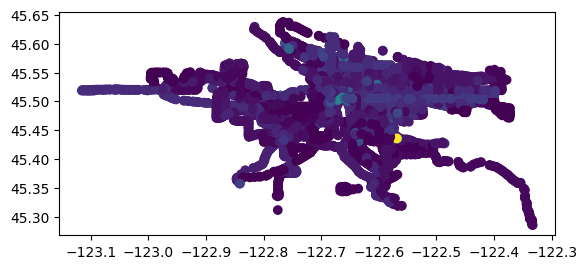

In [25]:
stop_location_and_frequency_geo.plot(column = 'stops_per_day')

Text(0.5, 1.0, 'Portland Trimet stop frequency')

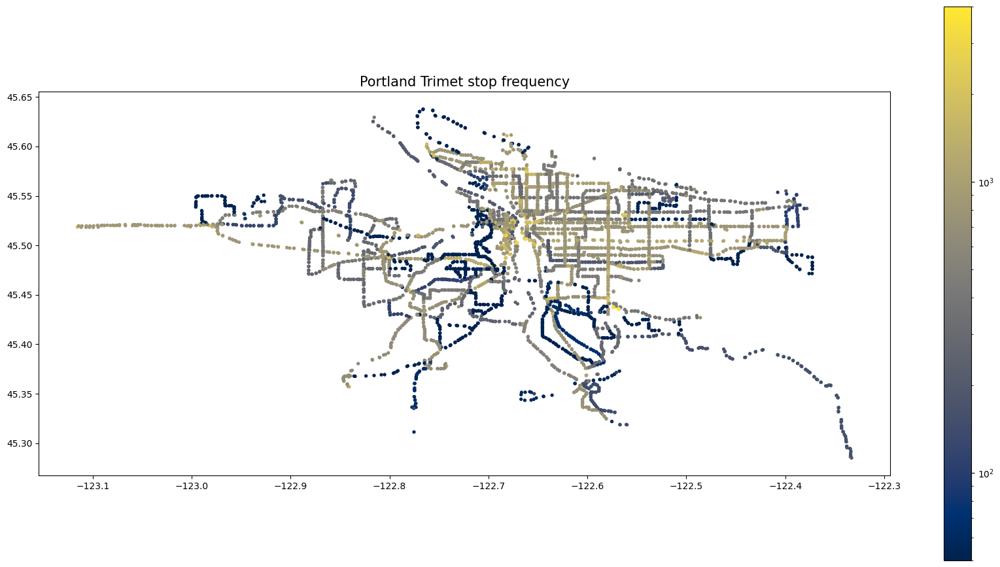

In [26]:
fig, ax = pyplot.subplots(figsize  = (21, 11))


#hex_df_list.get('hexagons_2010').plot(column = 'EstProjectCost',
stop_location_and_frequency_geo.plot(column = 'stops_per_day',
                cmap = 'cividis',
                legend = True,
                norm=plt.colors.LogNorm(vmin = 50, vmax = 4000),
                s = 8,
                ax = ax)

ax.set_title("Portland Trimet stop frequency", fontsize=15)

In [27]:
print(stop_location_and_frequency_geo.loc[3].geometry)

POINT (-122.67307 45.420217)


In [28]:
tt = {"stop_name", "stops_per_day"}

Trimet_Stop_Frequency_Interactive = stop_location_and_frequency_geo.explore(column = 'stops_per_day', vmax = 3000, tooltip = tt)

In [29]:
Trimet_Stop_Frequency_Interactive

In [30]:
#Trimet_Stop_Frequency_Interactive.save('Trimet_Stop_Frequency_Interactive.html')

In [31]:
layer = pdk.Layer(
    "HexagonLayer",
    stop_location_and_frequency_geo,
    get_position=["stop_lon", "stop_lat"],
    opacity = 0.2,
    auto_highlight=True,
    elevation_scale=8,
    pickable=False,
    elevation_range=[0, 3000],
    extruded=True,
    coverage=1,
)

# Set the viewport location
view_state = pdk.ViewState(
    longitude=-122.675,
    latitude=45.5,
    zoom=8.5,
    min_zoom=5,
    max_zoom=15,
    pitch=35.5,
    bearing=12,
)


tt = {"html": "<b>Value per Square Meter:</b> {stops_per_day}"}
# Render
hex_map = pdk.Deck(layers=[layer],
                   initial_view_state=view_state,
                   tooltip = tt)

In [32]:
hex_map

{
  "initialViewState": {
    "bearing": 12,
    "latitude": 45.5,
    "longitude": -122.675,
    "maxZoom": 15,
    "minZoom": 5,
    "pitch": 35.5,
    "zoom": 8.5
  },
  "layers": [
    {
      "@@type": "HexagonLayer",
      "autoHighlight": true,
      "coverage": 1,
      "data": [
        {
          "direction": "East",
          "geometry": {
            "coordinates": [
              -122.675671,
              45.420609
            ],
            "type": "Point"
          },
          "location_type": 0,
          "parent_station": null,
          "position": "Nearside",
          "stop_code": "2",
          "stop_desc": "Eastbound stop in Lake Oswego (Stop ID 2)",
          "stop_lat": 45.420609,
          "stop_lon": -122.675671,
          "stop_name": "A Ave & Chandler",
          "stop_url": "https://trimet.org/home/stop/2",
          "stops_per_day": 257,
          "tts_stop_name": "ae avenue & chandler",
          "zone_id": "B"
        },
        {
          "direction": "East",
          "geometry": {
            "coordinates": [
              -122.665197,
              45.419388
            ],
            "type": "Point"
          },
          "location_type": 0,
          "parent_station": null,
          "position": "Farside",
          "stop_code": "3",
          "stop_desc": "Eastbound stop in Lake Oswego (Stop ID 3)",
          "stop_lat": 45.419388,
          "stop_lon": -122.665197,
          "stop_name": "A Ave & Second St",
          "stop_url": "https://trimet.org/home/stop/3",
          "stops_per_day": 1014,
          "tts_stop_name": "ae avenue & second street",
          "zone_id": "B"
        },
        {
          "direction": "West",
          "geometry": {
            "coordinates": [
              -122.675152,
              45.420703
            ],
            "type": "Point"
          },
          "location_type": 0,
          "parent_station": null,
          "position": "Nearside",
          "stop_code": "4",
          "stop_desc": "Westbound stop in Lake Oswego (Stop ID 4)",
          "stop_lat": 45.420703,
          "stop_lon": -122.675152,
          "stop_name": "A Ave & 10th St",
          "stop_url": "https://trimet.org/home/stop/4",
          "stops_per_day": 270,
          "tts_stop_name": "ae avenue & 10th street",
          "zone_id": "B"
        },
        {
          "direction": "East",
          "geometry": {
            "coordinates": [
              -122.67307,
              45.420217
            ],
            "type": "Point"
          },
          "location_type": 0,
          "parent_station": null,
          "position": "Nearside",
          "stop_code": "6",
          "stop_desc": "Eastbound stop in Lake Oswego (Stop ID 6)",
          "stop_lat": 45.420217,
          "stop_lon": -122.67307,
          "stop_name": "A Ave & 8th St",
          "stop_url": "https://trimet.org/home/stop/6",
          "stops_per_day": 257,
          "tts_stop_name": "ae avenue & 8th street",
          "zone_id": "B"
        },
        {
          "direction": "West",
          "geometry": {
            "coordinates": [
              -122.67268,
              45.420411
            ],
            "type": "Point"
          },
          "location_type": 0,
          "parent_station": null,
          "position": "Nearside",
          "stop_code": "7",
          "stop_desc": "Westbound stop in Lake Oswego (Stop ID 7)",
          "stop_lat": 45.420411,
          "stop_lon": -122.67268,
          "stop_name": "A Ave & 8th St",
          "stop_url": "https://trimet.org/home/stop/7",
          "stops_per_day": 270,
          "tts_stop_name": "ae avenue & 8th street",
          "zone_id": "B"
        },
        {
          "direction": "East",
          "geometry": {
            "coordinates": [
              -122.593886,
              45.363509
            ],
            "type": "Point"
          },
          "location_type": 0,
          "parent_station": null,
          "position": "At",
         

In [33]:
#hex_map.to_html("Trimet_Stop_Frequency_PyDeck.html")